In [1]:
# Notebook to generate OMOP Embedding figures
# run multiple OMOPs for one embedding to gain statistical significance
# compare the worst and best Embedding-Run - embeddings against each other

import numpy as np
import hydra
from hydra import compose, initialize
from omegaconf import OmegaConf
import seaborn as sns
import torch
import pandas as pd
import umap
from umap import UMAP
import ehrgraphs
from ehrgraphs.training import setup_training
from tqdm import tqdm
import matplotlib
import matplotlib.pyplot as plt
import seaborn as sns

Using backend: pytorch


In [2]:
# function to setup presentable layout (Bachelor Arbeit) for matplotlob
def setup_matplotlib():
    def setSnsStyle(style):
        sns.set(style=style, font_scale=2.0)                      #1.5
        font = {"family": "serif", "weight": "normal", "size": 45} #30
        matplotlib.rc("font", **font)
        matplotlib.rcParams["xtick.labelsize"] = 28               #16
        matplotlib.rcParams["ytick.labelsize"] = 28               #16
        matplotlib.rcParams["axes.titlesize"] = 42                #24
        matplotlib.rcParams["axes.labelsize"] = 40                #20
        matplotlib.rcParams["legend.frameon"] = True

    setSnsStyle("ticks")

In [3]:
# function to print out multiple UMAP graphs from different embeddings
# allow hyperparametertuning
# data has to be either a full path to the embedding.feather or just the name in the /..../embeddings_leonard folder
def build_UMAP(concepts, data, min_dist=0.1, metric='euclidean', n_neighbors=15 ):
    # save row DataFrame in list for plotting
    row_list=[]
    # convert string emb_name into list
    if type(data) is not list:
        temp_list =[]
        temp_list.append(data)
        data = temp_list
        
    for data_name in data:
        # include path arguments
        if data_name.startswith('/'):
            path = data_name
        else:
            path = '/sc-projects/sc-proj-ukb-cvd/data/2_datasets_pre/220208_graphembeddings/embeddings_leonard/Embedding_dict_' + data_name + '.feather'
        embedding_df = pd.read_feather(path)
        #num_record_nodes = len(datamodule.record_node_indices) #72036
        without_phecodes=71036 
        embedder = torch.nn.Embedding(without_phecodes, 1024)#args.model.num_outputs)

        embedding_df.set_index('nodes', inplace=True)

        # filter node-embedding out of all nodes
        for i, c in enumerate(datamodule.record_cols):
            # exclude phecodes bc there not present in datamodule.record_cols
            if not c.startswith('phecode'):
                try:
                    e = embedding_df.loc[c].embeddings
                    embedder.weight.data[i] = torch.from_numpy(e)
                except KeyError as err:
                    x=0 # placeholder
                    #print(f'Embedding missing for {err}')

        # fit data in UMAP and Transoform to 2D-embedding-space 
        es = embedder.weight.data.numpy()
        print('length embedder.weight.data.numpy: ',len(es))
        # build UMAP with hyperparameters
        fit = umap.UMAP(
            n_neighbors=n_neighbors,
            min_dist=min_dist,
            metric=metric,
            n_jobs=-1, # all cores
            n_epochs=500, # larger value more accurate -> 200 default
            )
        es_2d = fit.fit_transform(es)
        
        rows = concepts.set_index('concept_id').loc[[r for r in datamodule.record_cols if not r.startswith('phecode')]].copy()
        print(len(rows), len(es_2d))
        # %%
        rows['e0'] = es_2d[:, 0]
        rows['e1'] = es_2d[:, 1]
        
        # decide the return type of the function (DataFrame or List of DataFrames)
        if len(data)==1: 
            return rows
        else:
            row_list.append(rows)
    return row_list

# function to plot multiple UMAP figures
#rows_list, subplot_title_list, title, (3,3)
def plot_figure(row_list, data_name,title, subPlot: tuple):
    setup_matplotlib()
    # build multiple figures in one plot
    fig, axes = plt.subplots(subPlot[0],subPlot[1], figsize=(44, 22), sharey=False, sharex=False) #((ax1, ax2, ax3, ax4),(ax5, ax6, ax7, ax8),(ax9, ax10, ax11, ax12),(ax13, ax14, ax15, ax16))
    fig.suptitle('UMAP - dimensional reduction')
    ite=0 # counter to accsess title in data_name list
    for ax_list in axes:
        for ax in ax_list:
            if ite ==len(row_list)-1: has_legend=True
            else: has_legend=False
            g = sns.scatterplot(data=row_list[ite], x='e0', y='e1', hue='domain_id', ax=ax, legend=has_legend) #style='concept_class_id'
            if has_legend:
                #g.legend(loc='center right', bbox_to_anchor=(1.2,0.5))
                g.legend_.remove()
            ax.set_title(data_name[ite])
            ite+=1
    handles, labels = axes[-1][-1].get_legend_handles_labels() 
    fig.legend(handles, labels, loc='lower right', fontsize = 'small',markerscale=3)
    #plt.subplots_adjust(right=1.5)
    plt.tight_layout()
    plt.show()
    fig.savefig(title)


In [ ]:
# ONE
hydra.core.global_hydra.GlobalHydra().clear()

initialize(config_path="../../../ehrgraphs/config")
args = compose(
    config_name="config",
    overrides=[
        "user_config=/home/tilingl/ehrgraphs/config/experiments/graphembeddings_leonard_thesis_220421",
        "model.num_outputs=1024",
    ],
)
print(OmegaConf.to_yaml(args))


In [5]:
# TWO
datamodule, model, tags = setup_training(args)


/sc-projects/sc-proj-ukb-cvd/data/2_datasets_pre/211110_anewbeginning/artifacts/phecode_definitions_220328.feather
/sc-projects/sc-proj-ukb-cvd/data/2_datasets_pre/211110_anewbeginning/artifacts/record_frequencies_220627.feather
/sc-projects/sc-proj-ukb-cvd/data/2_datasets_pre/211110_anewbeginning/artifacts/graph_full_220413_prone_1024_edge_weights_2022-04-13.feather
/sc-projects/sc-proj-ukb-cvd/data/2_datasets_pre/211110_anewbeginning/artifacts/final_records_omop_220531.feather


  0%|          | 0/15 [00:00<?, ?it/s]

/sc-projects/sc-proj-ukb-cvd/data/2_datasets_pre/211110_anewbeginning/artifacts/eids_211209.yaml
/sc-projects/sc-proj-ukb-cvd/data/2_datasets_pre/211110_anewbeginning/artifacts/baseline_covariates_220323.feather
/sc-projects/sc-proj-ukb-cvd/data/2_datasets_pre/211110_anewbeginning/artifacts/graph_full_220413.p
Generating train dataset...
Generating valid dataset...
Using edge types: ['Subsumes' 'Is a' 'ATC - RxNorm sec up' 'RxNorm is a' 'Tradename of'
 'Consists of' 'Has tradename' 'Constitutes' 'RxNorm has ing'
 'RxNorm inverse is a' 'RxNorm ing of' 'RxNorm - ATC'
 'RxNorm - ATC sec up' 'Dose form group of' 'Has dose form group'
 'Has AMP' 'AMP of' 'Has asso morph' 'Has pathology' 'Has method'
 'Is descendant of' 'Is ancestor of' 'Is associated with' 'Has interprets'
 'Asso morph of' 'Interprets of' 'SNOMED to Phecode' 'Method of'
 'Pathology of' 'Phecode to SNOMED' 'Interacts with' 'Is part of'
 'Composed of']


In [6]:
# THREE
concepts = pd.read_csv("/sc-projects/sc-proj-ukb-cvd/data/mapping/athena/CONCEPT.csv", sep="\t")
concepts.concept_id = concepts.concept_id.apply(lambda s: f"OMOP_{s}")

/home/tilingl/miniconda3/envs/ehrgraphs2/lib/python3.9/site-packages/IPython/core/interactiveshell.py:3457: DtypeWarning: Columns (5,6,9) have mixed types.Specify dtype option on import or set low_memory=False.
  exec(code_obj, self.user_global_ns, self.user_ns)


In [7]:
# FOUR 
# mathplotlib styles
setup_matplotlib()

In [14]:
# Explore Phecodes and match them
ids = concepts.concept_id
#phecodes= [i for i in ids if i.startswith('phecode')]
print(phecodes)

[]


In [ ]:
# %%
num_record_nodes = len(datamodule.record_node_indices) #72036
without_phecodes=71036 
embedder = torch.nn.Embedding(without_phecodes, 1024)#args.model.num_outputs)

embedding_df.set_index('nodes', inplace=True)


In [27]:
print(len(datamodule.record_cols))
print(num_record_nodes)

72036
72036


Embedding missing for 'OMOP_1389112'
Embedding missing for 'OMOP_19091110'
Embedding missing for 'OMOP_36716970'
Embedding missing for 'OMOP_40545672'
Embedding missing for 'OMOP_4268284'
Embedding missing for 'OMOP_42899275'
Embedding missing for 'OMOP_42899779'
Embedding missing for 'OMOP_42899849'
Embedding missing for 'OMOP_42899908'
Embedding missing for 'OMOP_42903627'
Embedding missing for 'OMOP_43012447'
Embedding missing for 'OMOP_43012913'
Embedding missing for 'OMOP_43014115'
Embedding missing for 'OMOP_43532150'
Embedding missing for 'OMOP_43532347'
Embedding missing for 'OMOP_45775531'
Embedding missing for 'OMOP_45775560'
Embedding missing for 'OMOP_45892043'
Embedding missing for 'OMOP_724904'
Embedding missing for 'OMOP_724905'
Embedding missing for 'OMOP_739634'
71036


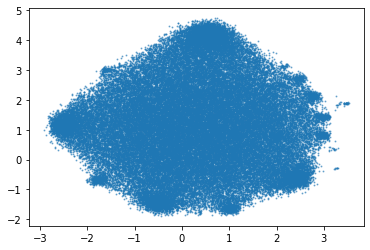

In [53]:
# %%
for i, c in enumerate(datamodule.record_cols):
    if not c.startswith('phecode'):
        try:
            e = embedding_df.loc[c].embeddings
            embedder.weight.data[i] = torch.from_numpy(e)
        except KeyError as err:
            print(f'Embedding missing for {err}')

# %%
es = embedder.weight.data.numpy()
print(len(es))
es_2d = UMAP(n_jobs=-1).fit_transform(es)

# %%
import matplotlib.pyplot as plt

plt.scatter(es_2d[:, 0], es_2d[:, 1], alpha=0.5, s=1)


In [56]:

# %%
concepts = pd.read_csv("/sc-projects/sc-proj-ukb-cvd/data/mapping/athena/CONCEPT.csv", sep="\t")
concepts.concept_id = concepts.concept_id.apply(lambda s: f"OMOP_{s}")

# %%
rows = concepts.set_index('concept_id').loc[[r for r in datamodule.record_cols if not r.startswith('phecode')]].copy()
print(len(rows), len(es_2d))
# %%
rows['e0'] = es_2d[:, 0]
rows['e1'] = es_2d[:, 1]

# %%
fig, ax = plt.subplots(figsize=(18, 12))
sns.scatterplot(data=rows, x='e0', y='e1', hue='domain_id', style='concept_class_id', ax=ax)
fig.savefig("DistMult.png") 

length embedder.weight.data.numpy:  71036
71036 71036
Error ('OMOP_201254', 'OMOP_4066271')
Error ('OMOP_196523', 'OMOP_37110974')
Error ('OMOP_4099974', 'OMOP_44818363')
[0, 0, 1, 1, 2, 2, 3, 3, 4, 4, 5, 5, 6, 6]
14 14 14
#########             x          y  color
0    1.881101   6.883866      0
1   13.729383   2.062823      0
2   -0.308934   6.524773      1
3   13.421994   2.443437      1
4   -0.695425   7.364882      2
5   13.405451   2.418000      2
6    6.986579   6.182112      3
7   22.024324   2.247901      3
8    7.871050 -17.054390      4
9    4.170361  -6.338308      4
10   0.066078   6.634855      5
11  13.356101   2.537659      5
12  11.832677   7.587734      6
13   4.663982 -32.105507      6


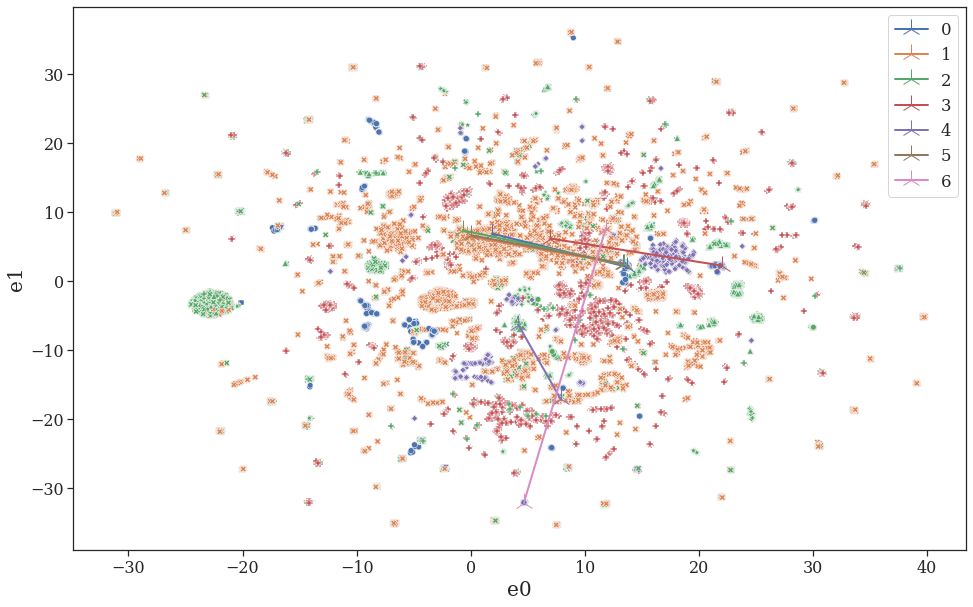

In [127]:
# test HYPERPARAMETER and visualize singel codes 
codes=[('OMOP_201254','OMOP_4066271'),('OMOP_196523' , 'OMOP_37110974'), ('OMOP_257007','OMOP_934075'), ('OMOP_378253', 'OMOP_1115008'),('OMOP_320128', 'OMOP_1367500'), ('OMOP_317009','OMOP_718122'),( 'OMOP_4204653', 'OMOP_4038238'),('OMOP_4099974', 'OMOP_44818363'),('OMOP_4064161','OMOP_956874') ,('OMOP_4209097','OMOP_1112921') ]

row = build_UMAP(concepts, ['NodePiece_t2'], min_dist=0.59, n_neighbors=75)


px=[]
py=[]
for c in codes:
    try:
        x=row.loc[c[0]].e0
        y=row.loc[c[0]].e1
        x2=row.loc[c[1]].e0
        y2=row.loc[c[1]].e1
    except:
        print(f'Error {c}')
        continue
    px.append(x)
    py.append(y)
    px.append(x2)
    py.append(y2)
numbers=[i for i in [j for j in range(0,7)] for x in (0,1)]
print(numbers)
#color=['A' ,'A', 'B','B','C', 'C', 'D','D','E', 'E','F','F','G', 'G']
d={'x':px, 'y': py, 'color':numbers}
print(len(color), len(px), len(py))
df_pairs=pd.DataFrame(data=d)
print('#########' , df_pairs)
        
    
# plotting UMAP and code Pairs

fig, ax = plt.subplots(figsize=(16, 10))
sns.scatterplot(data=row, x='e0', y='e1', hue='domain_id', style='concept_class_id', ax=ax, legend=False)
# grouping by color pairs to evaluate the real pairs
groups = df_pairs.groupby('color')
for name, group in groups:
    plt.plot(group.x, group.y, marker='2', linestyle='solid',linewidth=2, markersize=20, label=name)

plt.legend()
#plt.scatter(x=p_x, y=p_y, color="yellow")

fig.savefig("NodePiece_t2.png") 

In [65]:
# try to locate codes in row DataFrame
#print(row.index)


Error OMOP_4066271
Error OMOP_37110974
Error OMOP_44818363


In [7]:
# ALL EMBEDDINGS MAX HYPERPARAMETER PICTURE
embs=['TransE_Test', 'RotatE','ComplEx', 'RotatE_batch', 'random_rotate', 'DistMult', 'random_normal', 'TransE', 'MuRE', 'NodePiece_t1', 'ConvE_t1', 'NodePiece_t2']
rest=['TransE_Test', 'RotatE', 'TransE_false', 'ComplEx_batch', 'RESCAL', 'TransE_batch', 'DistMult_t2', 'ConvE']
tup=(1,1)
#print(type(rows))
##r=build_UMAP(concepts, ['ComplEx'], min_dist=0.1, metric='euclidean', n_neighbors=5)
##plot_figure(r,['ComplEx'],tup)

In [ ]:
# HYPERPARAMETER BIG PICTURE

rows_list=[]
names_list=[]
count=0
for d in tqdm((0.25,0.5, 0.75, 0.9), desc='min_dist'):
    for n in tqdm((15, 20, 50, 100), desc='num_neighbours'):
        count+=1
        if count<=3:continue
        rows_list.append(build_UMAP(concepts,['NodePiece_t2'], min_dist=d, metric='euclidean', n_neighbors=n))
        names_list.append('min_dist={}'.format(d) + '  num_neighb={}'.format(n))
plot_figure(rows_list, names_list)

In [ ]:
#row=build_UMAP(concepts,['TransE_Test'], min_dist=0.1, metric='euclidean', n_neighbors=5)
first3=rows_list
print(len(first3))


16


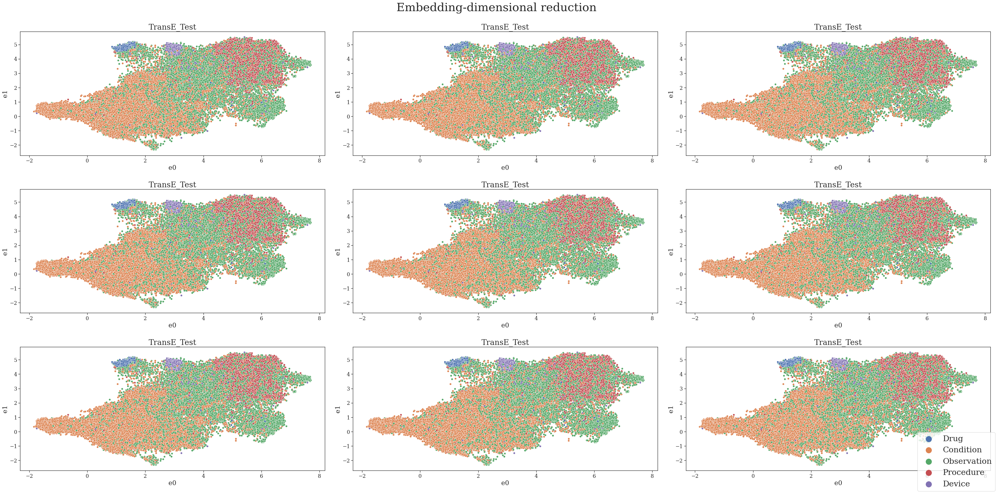

In [60]:
# use function
l = ['TransE_Test', 'RotatE', 'ComplEx', 'RotatE_batch', 'random_rotate', 'DistMult', 'random_normal', 'TransE', 'MuRE', 'NodePiece_t1', 'ConvE_t1', 'NodePiece_t2']
#row = build_UMAP(concepts,['TransE_Test'], min_dist=0.1, metric='euclidean', n_neighbors=20)

print(len(rows))
#plot_figure(rows, ['TransE_Test', 'RotatE','TransE_Test', 'RotatE','TransE_Test', 'RotatE','TransE_Test', 'RotatE','TransE_Test', 'RotatE','TransE_Test', 'RotatE','TransE_Test', 'RotatE','TransE_Test', 'RotatE'], (4,4))
plot_figure(rows[:9], ['TransE_Test', 'TransE_Test','TransE_Test', 'TransE_Test','TransE_Test', 'TransE_Test','TransE_Test', 'TransE_Test','TransE_Test'], (3,3))

length embedder.weight.data.numpy:  71036
71036 71036
-----calculated UMAP--------
length embedder.weight.data.numpy:  71036
71036 71036
-----calculated UMAP--------
length embedder.weight.data.numpy:  71036
71036 71036
-----calculated UMAP--------
length embedder.weight.data.numpy:  71036
71036 71036
-----calculated UMAP--------
length embedder.weight.data.numpy:  71036
71036 71036
-----calculated UMAP--------
length embedder.weight.data.numpy:  71036
71036 71036
-----calculated UMAP--------
length embedder.weight.data.numpy:  71036
71036 71036
-----calculated UMAP--------
length embedder.weight.data.numpy:  71036
71036 71036
-----calculated UMAP--------
length embedder.weight.data.numpy:  71036
71036 71036
-----calculated UMAP--------


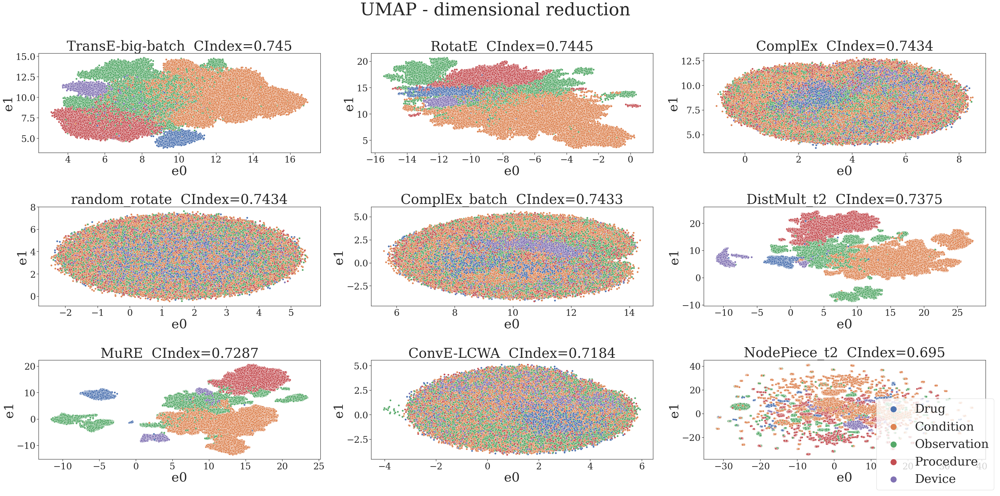

In [8]:
# FOR BACHELOR THESIS 
# Produce one UMAP with most Embeddings
emb_list=['ComplEx', 'RotatE_batch', 'random_rotate', 'DistMult', 'random_normal', 'TransE', 'MuRE', 'NodePiece_t1', 'ConvE_t1', 'NodePiece_t2']
rest=['TransE_Test', 'RotatE', 'TransE_false', 'ComplEx_batch', 'RESCAL', 'TransE_batch', 'DistMult_t2', 'ConvE']
big_picture_score_list=['0.745', '0.7445', '0.7439','0.7434','0.7434', '0.7434','0.7287', '0.7184', '0.695']
big_picture=['TransE_Test','RotatE','TransE_less_relations','ComplEx','DistMult','random_rotate','MuRE', 'ConvE_t1', 'NodePiece_t2']

twoXtwo_scores = ['0.7434', '0.7403', '0.736', '0.695']
twoXtwo = ['RotatE_batch',  'RESCAL', 'TransE',  'NodePiece_t1'] 

best_middle_worse_scores=['0.745', '0.7445', '0.7434', '0.7434',       '0.7433',       '0.7375',     '0.7287', '0.7184',   '0.695']
best_middle_worse=['TransE_Test','RotatE','ComplEx', 'random_rotate', 'ComplEx_batch','DistMult_t2','MuRE','ConvE_t1', 'NodePiece_t2']

big_all_score_list=['0.745', '0.7445', '0.7439',             '0.7437',      '0.7434', '0.7434',  '0.7434',        '0.7434',     '0.7433',        '0.7433',              '0.7429',         '0.7426',      '0.7403','0.7397',      '0.7375',     '0.736','0.7334','0.7287','0.7223',      '0.7184',   '0.695']
big_all=     ['TransE_Test','RotatE','TransE_less_relations','TransE_false','ComplEx','DistMult','random_rotate','RotatE_batch','ComplEx_batch','TransE_rare_relations','TransE_less001','random_normal','RESCAL','TransE_batch','DistMult_t2','TransE','ConvE','MuRE',  'NodePiece_t1','ConvE_t1', 'NodePiece_t2']
# all embeddings len=21

# list with NEW NAMES for BACHELOR THESIS
new_titles_best_middle_worse=['TransE-big-batch','RotatE','ComplEx', 'random_rotate', 'ComplEx_batch','DistMult_t2','MuRE','ConvE-LCWA', 'NodePiece_t2']


rows_list=[] #saves calculations og UMAPs
subplot_title_list=[] # "--"
j=0
rows_list2=[]
subplot_title_list2=[]
for emb_name in best_middle_worse:
    # start calculating umap with gloabl perspectiv
    rows_list.append(build_UMAP(concepts,emb_name, min_dist=0.99, metric='euclidean', n_neighbors=75))
    # add emb-title from new names list:
    subplot_title_list.append(new_titles_best_middle_worse[j] + '  CIndex={}'.format(best_middle_worse_scores[j]))
    j+=1
    print("-----calculated UMAP--------")


# plotting one big plot
title = 'UMAPs-3x3 final'
plot_figure(rows_list, subplot_title_list, title, (3,3))

